In [3]:
import uproot
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import time
import matplotlib.image as mpim
import matplotlib.animation as animation

#open files
file = uproot.open("/nevis/riverside/data/isafa/MC/output_SBNOsc_NumuSelection_Modern_Uboone_Lite.root")
file2 = uproot.open("/nevis/riverside/data/isafa/MC/output_SBNOsc_NueSelection_Modern_UBOONE_Numu_Lite.root")
file3 = uproot.open("/nevis/riverside/data/isafa/MC/output_SBNOsc_NueSelection_Modern_UBOONE_Nu_Osc_Lite.root") 
file4 = uproot.open("/nevis/riverside/data/isafa/MC/output_SBNOsc_NueSelection_Modern_UBOONE_Intrinsic_Nue_Lite.root")

#grab the "protons on target" measurement for each dataset
pot = file["totpot"].member("fElements")[0] 
pot2 = file2["totpot"].member("fElements")[0]
pot3 = file3["totpot"].member("fElements")[0]
pot4 = file4["totpot"].member("fElements")[0]

#unpack each file and grab the relevant variables
Numu_cc = file["tree_numu_cc"].arrays(["reco_energy","true_energy","nu_pdg","true_baseline","weight"], library="pd")
Numu_nc = file["tree_numu_nc"].arrays(["reco_energy","true_energy","nu_pdg","true_baseline","weight"], library="pd")
Nue_Numu = file2["simpletree"].arrays(["reco_energy","true_energy","nu_pdg","true_baseline","weight"], library="pd")
Nue_NuOsc = file3["simpletree"].arrays(["reco_energy","true_energy","nu_pdg","true_baseline","weight"], library="pd")
Nue_Intrinsic = file4["simpletree"].arrays(["reco_energy","true_energy","nu_pdg","true_baseline","weight"], library="pd")

# doing our "final" weight calculation:
# weights = desired POT * simulated_weights / simulated_POT
des_pot = 1.2e+21
# using 1.2e21 as our desired POT as the ~total beam collected over microboone's lifetime
Numu_cc["pot_weight"] = Numu_cc["weight"] * (des_pot / pot)
Numu_nc["pot_weight"] = Numu_nc["weight"] * (des_pot / pot)
Nue_Numu["pot_weight"] = Nue_Numu["weight"] * (des_pot / pot2)
Nue_NuOsc["pot_weight"] = Nue_NuOsc["weight"] * (des_pot / pot3)
Nue_Intrinsic["pot_weight"] = Nue_Intrinsic["weight"] * (des_pot / pot4)


#split datasets into neutrino types
cc_mu = Numu_cc[(Numu_cc["nu_pdg"] == 14.0)]
cc_mua = Numu_cc[(Numu_cc["nu_pdg"] == -14.0)]
nc_mu = Numu_nc[(Numu_nc["nu_pdg"] == 14.0)]
nc_mua = Numu_nc[(Numu_nc["nu_pdg"] == -14.0)]
osc_e = Nue_NuOsc[(Nue_NuOsc["nu_pdg"] == 12.0)]
osc_ea = Nue_NuOsc[(Nue_NuOsc["nu_pdg"] == -12.0)]
intrin_e = Nue_Intrinsic[(Nue_Intrinsic["nu_pdg"] == 12.0)]
intrin_ea = Nue_Intrinsic[(Nue_Intrinsic["nu_pdg"] == -12.0)]

In [4]:
# probability for mu->e, e->e, and mu->mu oscillations
# in terms of Ue4, Um4, and deltam2_41
def prob_energy(params, deltam_41, L_E, Paa="mue", sin2s=False):
    if (sin2s==False):
        Ue4, Um4 = params
    
        # probability for mu->e oscillation (nue appearance)
        if (Paa=="mue"):
            #sin2(2*theta_mue) = sin2(2*theta_14)sin2(theta_24) = 4 * (U_m4)^2 * (U_e4)^2
            probab = ((4*(Ue4**2)*(Um4)**2) * (np.sin(1.27*deltam_41*L_E))**2)
        
        # probability for e->e (nue survival)
        elif (Paa=="ee"):
            #sin2(2*theta_ee) = sin2(2*theta_14) = 4 * (1-(U_e4)^2) * (U_e4)^2
            probab =  1 - ((4*(Ue4**2)*(1-(Ue4)**2)) * (np.sin(1.27*deltam_41*L_E))**2)
        
        # probability for mu->mu (mue survival)
        elif (Paa=="mumu"):
            # sin2(2*theta_mumu) = 4*cos2(theta_14)*sin2(theta_24)*[1 - cos2(theta_14)*sin2(theta_24)] = 4 * (1-(U_m4)^2) * (U_m4)^2
            probab = 1 - ((4*(Um4**2)*(1-(Um4)**2)) * (np.sin(1.27*deltam_41*L_E))**2)
        
        else:
            print("Choose which oscillation type you want: mue, ee, mumu")
            return(0)
        
    else:
        sin2_14, sin2_24 = params
        
        # probability for mu->e oscillation (nue appearance)
        if (Paa=="mue"):
            #sin2(2*theta_mue) = sin2(2*theta_14)sin2(theta_24) = 4 * (U_m4)^2 * (U_e4)^2
            # sin2(2*theta_mue) ~= 1/4 * sin2(2*theta_14) * sin2(2*theta_24)
            probab = (0.25 * sin2_14 * sin2_24) * (np.sin(1.27*deltam_41*L_E))**2
        
        # probability for e->e (nue survival)
        elif (Paa=="ee"):
            #sin2(2*theta_ee) = sin2(2*theta_14) = 4 * (1-(U_e4)^2) * (U_e4)^2
            # sin2(2*theta_ee) ~= sin2(2*theta_14)
            probab =  1 - ((sin2_14) * (np.sin(1.27*deltam_41*L_E))**2)
        
        # probability for mu->mu (mue survival)
        elif (Paa=="mumu"):
            # sin2(2*theta_mumu) = 4*cos2(theta_14)*sin2(theta_24)*[1 - cos2(theta_14)*sin2(theta_24)] = 4 * (1-(U_m4)^2) * (U_m4)^2
            # sin2(2*theta_mumu) ~= sin2(2*theta_24)
            probab = 1 - ((sin2_24) * (np.sin(1.27*deltam_41*L_E))**2)
        
        else:
            print("Choose which oscillation type you want: mue, ee, mumu")
            return(0)
        
    return(probab)


In [5]:
# create my covariance matrix:
# the diagonals are cov2_sys_i + sigma2_stat_i
# the off-diagonals are rho_ij*cov_sys_i*cov_sys_j
# we can make 4 seperate matrices: flux, cross-section, detector, and statistical and add them together (basically in quadrature)
# the matrix will be a (N_nue + N_numu) square

flux_sig = 0.15
flux_rho = 0.5

cross_sig = 0.2
cross_rho = 1

detect_sig = 0.03
detect_rho = 0

In [6]:
#if the expected count is 0, the sum goes to infinity, so just skip those boxes for right now
def chi2(expect, obs, error="poisson", dof_normalize=False, subtract_from_dof=0):
    if (np.isin(expect,0).any()):
        print("The expected freqency has a bin with 0 entries")
        return
    
    if (error=="poisson"):
        # uncorrelated data with poisson only error
        # sigma = sqrt(expected)
        # diff^2 / sigma^2
        diff = obs - expect
        diff2 = diff**2
        diff3 = diff2/expect
        
        chi2 =0
        n = 0
        for i in diff3:
            n = n+1
            if (np.isinf(i)):
                continue
            chi2 = chi2 + i

        if(dof_normalize):
            dof = n - subtract_from_dof
            chi2 = chi2/dof
            #print("chi2 per dof (" + str(dof) +"): "+str(chi2))
            return chi2
        else:
            #print("total chi2: " + str(chi2))
            return chi2
        
        
    elif (error=="correlated"):
        #this is for both nue and numu data that has correlated errors
        # assuming that the bins have already been appended together into the expect and obs arrays
        # currently only has non-dof-normalized option
        #print("inside correlated")
        
        stat_cov = np.zeros([expect.shape[0], expect.shape[0]])
        fractional_error = expect/(expect**2)
        np.fill_diagonal(stat_cov, fractional_error)
        # print("expect")
        # print(expect)
        # print("stat_cov")
        # print(stat_cov)
        
        flux_cov = np.zeros([expect.shape[0], expect.shape[0]])
        flux_cov.fill(flux_sig*flux_sig*flux_rho)
        np.fill_diagonal(flux_cov, flux_sig*flux_sig*1)
        # print("flux_cov")
        # print(flux_cov)
        
        cross_cov = np.zeros([expect.shape[0], expect.shape[0]])
        cross_cov.fill(cross_sig*cross_sig*cross_rho)
        np.fill_diagonal(cross_cov, cross_sig*cross_sig*1)
        # print("cross_cov")
        # print(cross_cov)
        
        detect_cov = np.zeros([expect.shape[0], expect.shape[0]])
        detect_cov.fill(detect_sig*detect_sig*detect_rho)
        np.fill_diagonal(detect_cov, detect_sig*detect_sig*1)
        # print("detect_cov")
        # print(detect_cov)
        
        fract_cov = stat_cov + flux_cov + cross_cov + detect_cov
        # print("fract_cov")
        # print(fract_cov)
        
        cov = fract_cov.copy()
        for i in range(expect.shape[0]):
            for j in range(expect.shape[0]):
                cov[i][j] = cov[i][j] * expect[i] * expect[j]
                
        # print("cov")
        # print(cov)
        
        inverse_cov = np.linalg.inv(cov)
        # print("inverse_cov")
        # print(inverse_cov)
        
        chi2 = 0
        for i in range(len(expect)):
            for j in range(len(expect)):
                dif1 = obs[i] - expect[i]
                dif2 = obs[j] - expect[j]
                diff2 = dif1*dif2
                
                diff3 = diff2 * inverse_cov[i][j] #or should it be j,i now that its inversed? 
                chi2 = chi2 + diff3
                # print(i, j)
                # print("obsi", obs[i], "expecti", expect[i])
                # print("obsj", obs[j], "expectj", expect[j])
                # print("diffs", dif1, dif2, diff2)
                # print("covariance element", inverse_cov[i][j])
                # print("chi2 element", diff3)
                # print("total chi2", chi2)
            
        return (chi2)


In [11]:
#make a function that takes in oscillation parameters and the intrinsic and oscilation data and spits out the chi2 value
#def osc_chi2(deltam2, thetaee, thetamue, intrin_data, osc_data, n=1):

variable_bins = np.array([0.16, 0.46, 0.76, 1.06, 1.36, 1.66, 1.96, 2.26, 2.56, 2.86, 3.16, 3.46, 3.76, 4.06, 6.00])
bins_widths = np.array([0.3, 0.3, 0.3, 0.3, 0.3, 0.3, 0.3, 0.3, 0.3, 0.3, 0.3, 0.3, 0.3, 1.94])
bin_centers = np.array([0.31, 0.61, 0.91, 1.21, 1.51, 1.81, 2.11, 2.41, 2.71, 3.01, 3.31, 3.61, 3.91, 5.03])

#unosc_intrinisc_nue_mc and fullosc_mc AND unosc_intrinsic_numu_mc
def osc_chi2_reco(params, unosc_intrinsic_nue_mc, fullosc_mc,unosc_intrinsic_numu_mc, n=1):
    deltam2, Ue4, Um4 = params
    nue_survival_probs = prob_energy([Ue4, Um4], deltam2, (unosc_intrinsic_nue_mc["true_baseline"]/1000)/unosc_intrinsic_nue_mc["true_energy"], Paa="ee")
    nue_appearance_probs = prob_energy([Ue4, Um4], deltam2, (fullosc_mc["true_baseline"]/1000)/fullosc_mc["true_energy"], Paa="mue")
    numu_survival_probs = prob_energy([Ue4, Um4], deltam2, (unosc_intrinsic_numu_mc["true_baseline"]/1000)/unosc_intrinsic_numu_mc["true_energy"], Paa="mumu")
    
    nue_survival_weight = unosc_intrinsic_nue_mc["pot_weight"] * nue_survival_probs
    nue_appearance_weight = fullosc_mc["pot_weight"] * nue_appearance_probs
    numu_survival_weight = unosc_intrinsic_numu_mc["pot_weight"] * numu_survival_probs
    
    nue_intrinsic = np.histogram(unosc_intrinsic_nue_mc["reco_energy"], bins=variable_bins, weights=unosc_intrinsic_nue_mc["pot_weight"]) #total intrinsic nue
    #plt.stairs(nue_intrinsic[0]/bins_widths, nue_intrinsic[1])
    #plt.show()
       
    nue_survival = np.histogram(unosc_intrinsic_nue_mc["reco_energy"], bins=nue_intrinsic[1], weights=nue_survival_weight) #intrinsic nue with oscillation disappearance
    nue_appearance = np.histogram(fullosc_mc["reco_energy"], bins=nue_intrinsic[1], weights=nue_appearance_weight) #oscilated numu->nue
    
    #now try adding the numu histogram
    numu_intrinsic = np.histogram(unosc_intrinsic_numu_mc["reco_energy"], bins=variable_bins, weights=unosc_intrinsic_numu_mc["pot_weight"]) #total intrinsic numu
    numu_survival = np.histogram(unosc_intrinsic_numu_mc["reco_energy"], bins=nue_intrinsic[1], weights=numu_survival_weight) #intrinsic numu with oscillation disappearance
    
    #appending together nue and numu
    intrinsic_nu = np.concatenate([nue_intrinsic[0], numu_intrinsic[0]])
    signal_nu = np.concatenate([nue_survival[0]+nue_appearance[0], numu_survival[0]])
    
    nue_chi2_val = chi2(nue_intrinsic[0], nue_survival[0]+nue_appearance[0], dof_normalize=False, subtract_from_dof=3, error="correlated")
    numu_chi2_val = chi2(numu_intrinsic[0], numu_survival[0], dof_normalize=False, subtract_from_dof=3, error="correlated")
    total_chi2_val = chi2(intrinsic_nu, signal_nu, dof_normalize=False, subtract_from_dof=3, error="correlated")
    
#     #if (chi2_val > 5):
#     #plt.subplot(sin2s_mue.shape[0], deltam2s.shape[0],n)
#         # plt.hist([unosc_intrinsic_nue_mc["true_energy"], fullosc_mc["true_energy"]], bins=nue_intrinsic[1], histtype="barstacked", edgecolor="black", label=["Intrinsic Survival Nue","Appearance Nue"], weights=[nue_survival_weight,nue_appearance_weight])
#         # plt.hist(unosc_intrinsic_nue_mc["true_energy"], bins=nue_intrinsic[1], color="red", histtype="step", label="Unoscillated Intrinsic Nue", weights=unosc_intrinsic_nue_mc["pot_weight"])
#         # plt.errorbar(bin_centers,nue_intrinsic[0], yerr=np.sqrt(nue_intrinsic[0]), fmt=" ", color="red", capsize=5)
#         # plt.errorbar(bin_centers, nue_survival[0]+nue_appearance[0], yerr= np.sqrt(nue_survival[0]+nue_appearance[0]), fmt=" ", color="black", capsize=5)
#         # plt.legend()
#         # plt.ylabel("Events")
#         # plt.xlabel("Energy {GeV}")
#         # plt.title("Intrinsic and Oscillated $\\nu_e$ \n$\Delta{m}^2=$" + str(deltam2) + " and $sin^2(2\\theta_{mue})=$" + str(sin2mue) + " and $sin^2(2\\theta_{ee})=$" + str(sin2ee) + "\n$\\chi^2=$" + str(round(chi2_val,5)))
#         # plt.show()
        
#     plt.figure(figsize=(20,5))
#     plt.subplot(131)
#     plt.hist([unosc_intrinsic_nue_mc["true_energy"], fullosc_mc["true_energy"]], bins=nue_intrinsic[1], histtype="barstacked", edgecolor="black", label=["Intrinsic Survival Nue","Appearance Nue"], weights=[nue_survival_weight,nue_appearance_weight])
#     plt.hist(unosc_intrinsic_nue_mc["true_energy"], bins=nue_intrinsic[1], color="red", histtype="step", label="Unoscillated Intrinsic Nue", weights=unosc_intrinsic_nue_mc["pot_weight"])
#     plt.errorbar(bin_centers,nue_intrinsic[0], yerr=np.sqrt(nue_intrinsic[0]), fmt=" ", color="red", capsize=5)
#     plt.errorbar(bin_centers, nue_survival[0]+nue_appearance[0], yerr= np.sqrt(nue_survival[0]+nue_appearance[0]), fmt=" ", color="black", capsize=5)
#     plt.legend()
#     plt.ylabel("Events")
#     plt.xlabel("Energy {GeV}")
#     plt.title("Intrinsic and Oscillated $\\nu_e$ \n$\Delta{m}^2=$" + str(deltam2) + " and $U_{e4}^2=$" + str(Ue4**2) + " and $U_{\\mu4}^2=$" + str(round(Um4**2, 4)) + "\n$\\chi^2=$" + str(round(nue_chi2_val,5)))
# #     plt.show()
    
    
#     plt.subplot(132)
#     plt.hist(unosc_intrinsic_numu_mc["true_energy"], bins=nue_intrinsic[1], histtype="step", weights = numu_survival_weight, label="Intrinsic Numu Survival")
#     plt.hist(unosc_intrinsic_numu_mc["true_energy"], bins=nue_intrinsic[1], histtype="step", weights= unosc_intrinsic_numu_mc["pot_weight"], label="Unoscillated Intrinsic Numu")
#     plt.errorbar(bin_centers,numu_intrinsic[0], yerr=np.sqrt(numu_intrinsic[0]), fmt=" ", color="red", capsize=5)
#     plt.errorbar(bin_centers, numu_survival[0], yerr= np.sqrt(numu_survival[0]), fmt=" ", color="black", capsize=5)
#     plt.legend()
#     plt.ylabel("Events")
#     plt.xlabel("Energy {GeV}")
#     plt.title("Intrinsic and Oscillated $\\nu_{\\mu}$ \n$\Delta{m}^2=$" + str(deltam2) + " and $U_{e4}^2=$" + str(Ue4**2) + " and $U_{\\mu4}^2=$" + str(round(Um4**2, 4)) + "\n$\\chi^2=$" + str(round(numu_chi2_val,5)))
# #     plt.show()
    
#     plt.subplot(133)
#     plt.plot(intrinsic_nu, label="intrinsic")
#     plt.plot(signal_nu, label="signal")
#     plt.yscale("log")
#     plt.legend()
#     plt.ylabel("Events")
#     plt.xlabel("Nue then Numu Energies")
#     plt.title("$\Delta{m}^2=$" + str(deltam2) + " and $U_{e4}^2=$" + str(Ue4**2) + " and $U_{\\mu4}^2=$" + str(round(Um4**2, 4)) + "\n$\\chi^2=$" + str(round(total_chi2_val,5)))
#     # plt.show()
    
    return (nue_chi2_val, numu_chi2_val, total_chi2_val)



In [12]:
deltam2s = np.logspace(np.log10(0.1),np.log10(10),30, base=10)

#if I want sin2_mue = [1e-5, 0.1] and sin2_ee = [0,0.5]
#sin2(2*theta_mue) = sin2(2*theta_14)sin2(theta_24) = 4 * (U_m4)^2 * (U_e4)^2
#sin2(2*theta_ee) = sin2(2*theta_14) = 4 * (1-(U_e4)^2) * (U_e4)^2

Ue4s = np.logspace(np.log10(0.01), np.log10(0.4), 30, base=10)
Um4s = np.logspace(np.log10(0.01), np.log10(0.4), 30, base=10)

In [13]:
#try a 3D plot
chi2_3d_with_numu = np.zeros((deltam2s.shape[0],Ue4s.shape[0], Um4s.shape[0]))
chi2_3d_only_nue = np.zeros((deltam2s.shape[0],Ue4s.shape[0], Um4s.shape[0]))
chi2_3d_only_numu = np.zeros((deltam2s.shape[0],Ue4s.shape[0], Um4s.shape[0]))

#break it up into 6 sections
start= time.time()
#for i in range(deltam2s.shape[0]):
for i in range(5):
    print("Event i:", str(i))
    t = time.time() - start
    print("Time elapsed in seconds since starting cell:", str(t))
    for j in range(Ue4s.shape[0]):
        for k in range(Um4s.shape[0]):
            nue_chi2, numu_chi2, total_chi2 = osc_chi2_reco([deltam2s[i], Ue4s[j], Um4s[k]], intrin_e, osc_e, cc_mu)
            chi2_3d_with_numu[i][j][k] = total_chi2
            chi2_3d_only_nue[i][j][k] = nue_chi2
            chi2_3d_only_numu[i][j][k] = numu_chi2
            #print("Event " + str(i) + "-" + str(j) + "-" + str(k) + " completed")
        #n = n+1
 
    
np.save("chi23d_30x30x30_with_numu_array_1_reco.npy", chi2_3d_with_numu)
np.save("chi23d_30x30x30_only_nue_array_1_reco.npy", chi2_3d_only_nue)
np.save("chi23d_30x30x30_only_numu_array_1_reco.npy", chi2_3d_only_numu)

#try a 3D plot
chi2_3d_with_numu = np.zeros((deltam2s.shape[0],Ue4s.shape[0], Um4s.shape[0]))
chi2_3d_only_nue = np.zeros((deltam2s.shape[0],Ue4s.shape[0], Um4s.shape[0]))
chi2_3d_only_numu = np.zeros((deltam2s.shape[0],Ue4s.shape[0], Um4s.shape[0]))

#break it up into 6 sections
start= time.time()
#for i in range(deltam2s.shape[0]):
for i in range(5,10):
    print("Event i:", str(i))
    t = time.time() - start
    print("Time elapsed in seconds since starting cell:", str(t))
    for j in range(Ue4s.shape[0]):
        for k in range(Um4s.shape[0]):
            nue_chi2, numu_chi2, total_chi2 = osc_chi2_reco([deltam2s[i], Ue4s[j], Um4s[k]], intrin_e, osc_e, cc_mu)
            chi2_3d_with_numu[i][j][k] = total_chi2
            chi2_3d_only_nue[i][j][k] = nue_chi2
            chi2_3d_only_numu[i][j][k] = numu_chi2
            #print("Event " + str(i) + "-" + str(j) + "-" + str(k) + " completed")
        #n = n+1
 
    
np.save("chi23d_30x30x30_with_numu_array_2_reco.npy", chi2_3d_with_numu)
np.save("chi23d_30x30x30_only_nue_array_2_reco.npy", chi2_3d_only_nue)
np.save("chi23d_30x30x30_only_numu_array_2_reco.npy", chi2_3d_only_numu)

#try a 3D plot
chi2_3d_with_numu = np.zeros((deltam2s.shape[0],Ue4s.shape[0], Um4s.shape[0]))
chi2_3d_only_nue = np.zeros((deltam2s.shape[0],Ue4s.shape[0], Um4s.shape[0]))
chi2_3d_only_numu = np.zeros((deltam2s.shape[0],Ue4s.shape[0], Um4s.shape[0]))

#break it up into 6 sections
start= time.time()
#for i in range(deltam2s.shape[0]):
for i in range(10,15):
    print("Event i:", str(i))
    t = time.time() - start
    print("Time elapsed in seconds since starting cell:", str(t))
    for j in range(Ue4s.shape[0]):
        for k in range(Um4s.shape[0]):
            nue_chi2, numu_chi2, total_chi2 = osc_chi2_reco([deltam2s[i], Ue4s[j], Um4s[k]], intrin_e, osc_e, cc_mu)
            chi2_3d_with_numu[i][j][k] = total_chi2
            chi2_3d_only_nue[i][j][k] = nue_chi2
            chi2_3d_only_numu[i][j][k] = numu_chi2
            #print("Event " + str(i) + "-" + str(j) + "-" + str(k) + " completed")
        #n = n+1
 
    
np.save("chi23d_30x30x30_with_numu_array_3_reco.npy", chi2_3d_with_numu)
np.save("chi23d_30x30x30_only_nue_array_3_reco.npy", chi2_3d_only_nue)
np.save("chi23d_30x30x30_only_numu_array_3_reco.npy", chi2_3d_only_numu)

#try a 3D plot
chi2_3d_with_numu = np.zeros((deltam2s.shape[0],Ue4s.shape[0], Um4s.shape[0]))
chi2_3d_only_nue = np.zeros((deltam2s.shape[0],Ue4s.shape[0], Um4s.shape[0]))
chi2_3d_only_numu = np.zeros((deltam2s.shape[0],Ue4s.shape[0], Um4s.shape[0]))

#break it up into 6 sections
start= time.time()
#for i in range(deltam2s.shape[0]):
for i in range(15,20):
    print("Event i:", str(i))
    t = time.time() - start
    print("Time elapsed in seconds since starting cell:", str(t))
    for j in range(Ue4s.shape[0]):
        for k in range(Um4s.shape[0]):
            nue_chi2, numu_chi2, total_chi2 = osc_chi2_reco([deltam2s[i], Ue4s[j], Um4s[k]], intrin_e, osc_e, cc_mu)
            chi2_3d_with_numu[i][j][k] = total_chi2
            chi2_3d_only_nue[i][j][k] = nue_chi2
            chi2_3d_only_numu[i][j][k] = numu_chi2
            #print("Event " + str(i) + "-" + str(j) + "-" + str(k) + " completed")
        #n = n+1
 
    
np.save("chi23d_30x30x30_with_numu_array_4_reco.npy", chi2_3d_with_numu)
np.save("chi23d_30x30x30_only_nue_array_4_reco.npy", chi2_3d_only_nue)
np.save("chi23d_30x30x30_only_numu_array_4_reco.npy", chi2_3d_only_numu)

#try a 3D plot
chi2_3d_with_numu = np.zeros((deltam2s.shape[0],Ue4s.shape[0], Um4s.shape[0]))
chi2_3d_only_nue = np.zeros((deltam2s.shape[0],Ue4s.shape[0], Um4s.shape[0]))
chi2_3d_only_numu = np.zeros((deltam2s.shape[0],Ue4s.shape[0], Um4s.shape[0]))

#break it up into 6 sections
start= time.time()
#for i in range(deltam2s.shape[0]):
for i in range(20,25):
    print("Event i:", str(i))
    t = time.time() - start
    print("Time elapsed in seconds since starting cell:", str(t))
    for j in range(Ue4s.shape[0]):
        for k in range(Um4s.shape[0]):
            nue_chi2, numu_chi2, total_chi2 = osc_chi2_reco([deltam2s[i], Ue4s[j], Um4s[k]], intrin_e, osc_e, cc_mu)
            chi2_3d_with_numu[i][j][k] = total_chi2
            chi2_3d_only_nue[i][j][k] = nue_chi2
            chi2_3d_only_numu[i][j][k] = numu_chi2
            #print("Event " + str(i) + "-" + str(j) + "-" + str(k) + " completed")
        #n = n+1
 
    
np.save("chi23d_30x30x30_with_numu_array_5_reco.npy", chi2_3d_with_numu)
np.save("chi23d_30x30x30_only_nue_array_5_reco.npy", chi2_3d_only_nue)
np.save("chi23d_30x30x30_only_numu_array_5_reco.npy", chi2_3d_only_numu)

#try a 3D plot
chi2_3d_with_numu = np.zeros((deltam2s.shape[0],Ue4s.shape[0], Um4s.shape[0]))
chi2_3d_only_nue = np.zeros((deltam2s.shape[0],Ue4s.shape[0], Um4s.shape[0]))
chi2_3d_only_numu = np.zeros((deltam2s.shape[0],Ue4s.shape[0], Um4s.shape[0]))

#break it up into 6 sections
start= time.time()
#for i in range(deltam2s.shape[0]):
for i in range(25,30):
    print("Event i:", str(i))
    t = time.time() - start
    print("Time elapsed in seconds since starting cell:", str(t))
    for j in range(Ue4s.shape[0]):
        for k in range(Um4s.shape[0]):
            nue_chi2, numu_chi2, total_chi2 = osc_chi2_reco([deltam2s[i], Ue4s[j], Um4s[k]], intrin_e, osc_e, cc_mu)
            chi2_3d_with_numu[i][j][k] = total_chi2
            chi2_3d_only_nue[i][j][k] = nue_chi2
            chi2_3d_only_numu[i][j][k] = numu_chi2
            #print("Event " + str(i) + "-" + str(j) + "-" + str(k) + " completed")
        #n = n+1
 
    
np.save("chi23d_30x30x30_with_numu_array_6_reco.npy", chi2_3d_with_numu)
np.save("chi23d_30x30x30_only_nue_array_6_reco.npy", chi2_3d_only_nue)
np.save("chi23d_30x30x30_only_numu_array_6_reco.npy", chi2_3d_only_numu)

Event i: 0
Time elapsed in seconds since starting cell: 0.0002300739288330078
Event i: 1
Time elapsed in seconds since starting cell: 86.50924825668335
Event i: 2
Time elapsed in seconds since starting cell: 173.1856334209442
Event i: 3
Time elapsed in seconds since starting cell: 260.1346251964569
Event i: 4
Time elapsed in seconds since starting cell: 347.3696825504303
Event i: 5
Time elapsed in seconds since starting cell: 0.0002796649932861328
Event i: 6
Time elapsed in seconds since starting cell: 88.58309316635132
Event i: 7
Time elapsed in seconds since starting cell: 177.577388048172
Event i: 8
Time elapsed in seconds since starting cell: 266.43157029151917
Event i: 9
Time elapsed in seconds since starting cell: 355.0913813114166
Event i: 10
Time elapsed in seconds since starting cell: 0.000263214111328125
Event i: 11
Time elapsed in seconds since starting cell: 88.28906059265137
Event i: 12
Time elapsed in seconds since starting cell: 176.48968744277954
Event i: 13
Time elapse

In [15]:
both_array_1 = np.load("chi23d_30x30x30_with_numu_array_1_reco.npy")
nue_array_1 = np.load("chi23d_30x30x30_only_nue_array_1_reco.npy")
numu_array_1 =  np.load("chi23d_30x30x30_only_numu_array_1_reco.npy")

both_array_2 = np.load("chi23d_30x30x30_with_numu_array_2_reco.npy")
nue_array_2 = np.load("chi23d_30x30x30_only_nue_array_2_reco.npy")
numu_array_2 =  np.load("chi23d_30x30x30_only_numu_array_2_reco.npy")

both_array_3 = np.load("chi23d_30x30x30_with_numu_array_3_reco.npy")
nue_array_3 = np.load("chi23d_30x30x30_only_nue_array_3_reco.npy")
numu_array_3 =  np.load("chi23d_30x30x30_only_numu_array_3_reco.npy")

both_array_4 = np.load("chi23d_30x30x30_with_numu_array_4_reco.npy")
nue_array_4 = np.load("chi23d_30x30x30_only_nue_array_4_reco.npy")
numu_array_4 =  np.load("chi23d_30x30x30_only_numu_array_4_reco.npy")

both_array_5 = np.load("chi23d_30x30x30_with_numu_array_5_reco.npy")
nue_array_5 = np.load("chi23d_30x30x30_only_nue_array_5_reco.npy")
numu_array_5 =  np.load("chi23d_30x30x30_only_numu_array_5_reco.npy")

both_array_6 = np.load("chi23d_30x30x30_with_numu_array_6_reco.npy")
nue_array_6 = np.load("chi23d_30x30x30_only_nue_array_6_reco.npy")
numu_array_6 =  np.load("chi23d_30x30x30_only_numu_array_6_reco.npy")

chi2_3d_with_numu_reco = np.concatenate([both_array_1[0:5], both_array_2[5:10], both_array_3[10:15], both_array_4[15:20], both_array_5[20:25], both_array_6[25:30]], axis=0)
chi2_3d_only_nue_reco =  np.concatenate([nue_array_1[0:5], nue_array_2[5:10], nue_array_3[10:15], nue_array_4[15:20], nue_array_5[20:25], nue_array_6[25:30]], axis=0)
chi2_3d_only_numu_reco =  np.concatenate([numu_array_1[0:5], numu_array_2[5:10], numu_array_3[10:15], numu_array_4[15:20], numu_array_5[20:25], numu_array_6[25:30]], axis=0)

np.save("chi23d_30x30x30_with_numu_array_reco.npy", chi2_3d_with_numu_reco)
np.save("chi23d_30x30x30_only_nue_array_reco.npy", chi2_3d_only_nue_reco)
np.save("chi23d_30x30x30_only_numu_array_reco.npy", chi2_3d_only_numu_reco)


Text(0.5, 0.92, '$\\nu_{e}$ and $\\nu_{\\mu}$ Spectra $\\chi^2$ Sensitivity to Variations in $U_{e4}^2$, $U_{\\mu4}^2$, and $\\Delta{m}_{41}^2$ \nPOT = 1.2e+21')

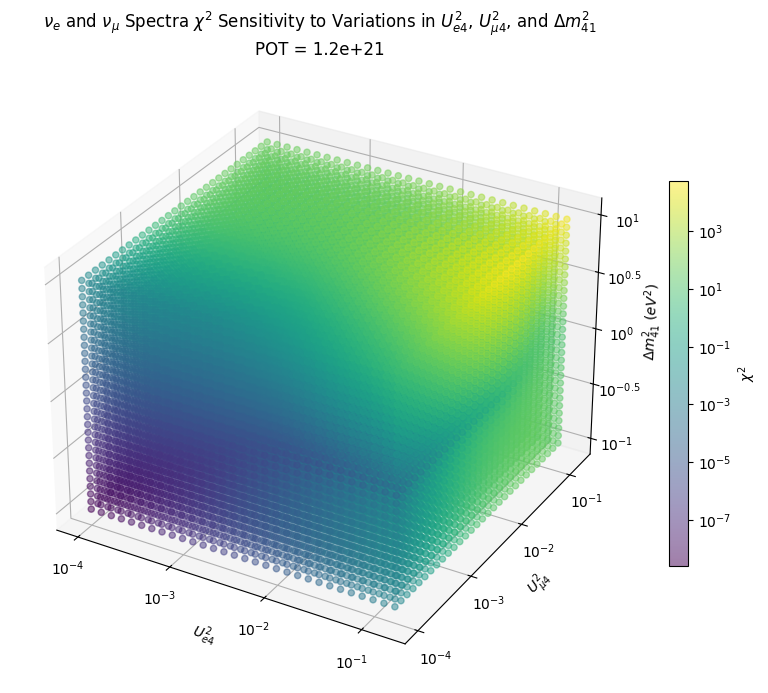

In [16]:
#try plotting a 3d scatterplot with colors=chi2 correspondance (no contours)

#apparantly you can't do a log scale axis in 3d scatterplot, so manually take the log myself, then plot on a linear scale
#Ue4_3d, Um4_3d, deltm3d = np.meshgrid(Ue4s, Um4s, deltam2s) 

#try doing it with Ue4^2 and Um4^2
Ue4_3d, Um4_3d, deltm3d = np.meshgrid(Ue4s**2, Um4s**2, deltam2s)

Ue4_3d_log = np.log10(Ue4_3d)
Um4_3d_log = np.log10(Um4_3d)
deltm3d_log = np.log10(deltm3d)

fig = plt.figure(figsize=(10,10))
ax = plt.axes(projection="3d")

scattr = ax.scatter3D(Ue4_3d_log, Um4_3d_log, deltm3d_log, c=chi2_3d_with_numu_reco, norm="log", alpha=0.5)
ax.set_xlabel("$U_{e4}^2$")
ax.set_xticks([-4,-3,-2,-1], labels=["$10^{-4}$", "$10^{-3}$", "$10^{-2}$", "$10^{-1}$"])
ax.set_ylabel("$U_{\mu4}^2$")
ax.set_yticks([-4,-3,-2,-1], labels=["$10^{-4}$", "$10^{-3}$", "$10^{-2}$", "$10^{-1}$"])
ax.set_zlabel("$\Delta{m}^2_{41}$ ($eV^2$)")
ax.set_zticks([-1,-0.5,0,0.5,1], labels=["$10^{-1}$", "$10^{-0.5}$", "$10^{0}$", "$10^{0.5}$", "$10^{1}$"])

fig.colorbar(scattr, label="$\\chi^2$", shrink=0.5, location="right") 
ax.set_title("$\\nu_{e}$ and $\\nu_{\mu}$ Spectra $\chi^2$ Sensitivity to Variations in $U_{e4}^2$, $U_{\mu4}^2$, and $\\Delta{m}_{41}^2$ \nPOT = 1.2e+21", fontsize="large")



In [18]:
# assign significant values for chi2
# # 2 degrees of freedom
# dof = 2
# cl_90 = 4.605
# cl_99 = 9.210
# cl_999 = 13.816

# 3 degrees of freedom
dof = 3
cl_90 = 6.251
cl_99 = 11.345
cl_999 = 16.266

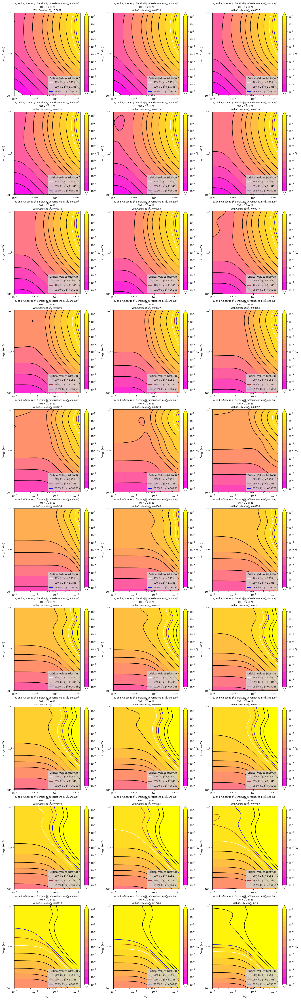

In [21]:
# make contour plots in U_e4 and deltam_41 plane 
plt.figure(figsize=(20,70))
for i in range(Um4s.shape[0]):
    
    plt.subplot(10,3,i+1)
    plt.contourf(Ue4s**2,deltam2s,chi2_3d_with_numu_reco[:,:,i],extend="both", norm="log",levels=[1e-8,1e-7,1e-6,1e-5,1e-4,1e-3,1e-2,0.03,0.1, 0.5,2,cl_90,cl_99,cl_999,50,100], cmap="spring")#, colors=["red","orange","yellow","green","blue","purple","pink"])
    plt.yscale("log")
    plt.xscale("log")
    cbar = plt.colorbar(label="$\chi^2$")
    cbar.set_ticks([1e-8,1e-7,1e-6,1e-5,1e-4,1e-3,0.01,0.1,1,10,100])

    CL = plt.contour(Ue4s**2,deltam2s, chi2_3d_with_numu_reco[:,:,i], norm="linear", levels=[0.01, 0.03, 0.1, 0.5,2], colors="black")
    #manual_locations = [(0.1,0.1),(0.41, 0.1), (0.37,0.2), (0.33, 0.3),(0.29, 0.4)]
    #plt.clabel(CL, inline=True, manual = manual_locations)
    CL1 = plt.contour(Ue4s**2,deltam2s, chi2_3d_with_numu_reco[:,:,i], norm="log", levels=[50,100], colors="black")
    #manual_locations1 = [(0.4,3)]
    #plt.clabel(CL1, inline=True, manual = manual_locations1)
    CL2 = plt.contour(Ue4s**2,deltam2s, chi2_3d_with_numu_reco[:,:,i], norm="log", levels=[cl_90, cl_99, cl_999], colors=["white","brown","blue"])
    critical_colors,critical_labels = CL2.legend_elements()
    #manual_locations2 = [(0.25,1),(0.25, 1.5),(0.25, 3)]
    #plt.clabel(CL2, inline=True, manual = manual_locations2)
    CL3 = plt.contour(Ue4s**2,deltam2s, chi2_3d_with_numu_reco[:,:,i], norm="linear", levels=[1e-8,1e-7,1e-6,1e-5,1e-4,1e-3], colors="black")
    #manual_locations3 = [(0.04, 0.15)]
    #plt.clabel(CL3, inline=True, manual = manual_locations3)
    
    plt.xlabel("$U_{e4}^2$")
    plt.ylabel("$\\Delta{m_{41}}^2$ $(eV^2)$")
    plt.title("$\\nu_{e}$ and $\\nu_{\mu}$ Spectra $\chi^2$ Sensitivity to Variations in $U_{e4}^2$ and $\\Delta{m^2_{41}}$ \nPOT = 1.2e+21 \nWith Constant $U_{\\mu4}^2$: " + str(round(Um4s[i]**2,5)), fontsize="small")
    plt.legend(critical_colors, ["90% CL: $\chi^2=$"+str(cl_90), "99% CL: $\chi^2=$"+str(cl_99), "99.9% CL: $\chi^2=$"+str(cl_999)], loc="lower right", facecolor="lightgray", title="Critical Values (dof="+str(dof)+")", fontsize="small")

    #if (i==17):
        #plt.scatter(0.02**2,5, color="red", marker="X")
    
    

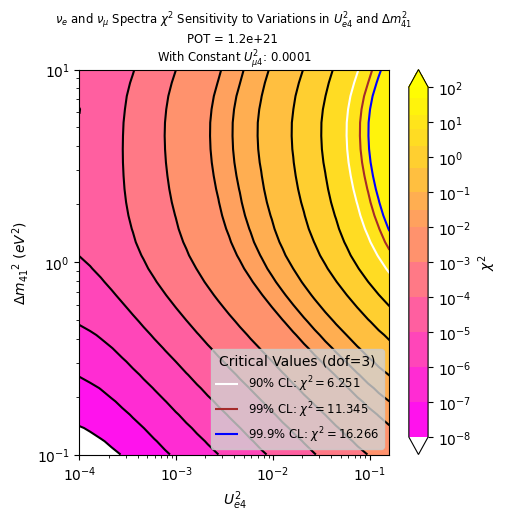

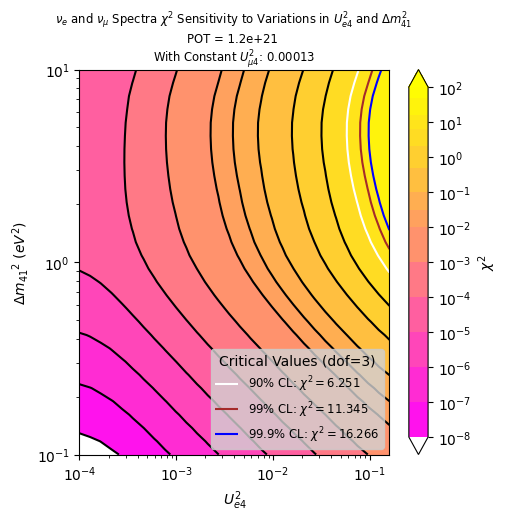

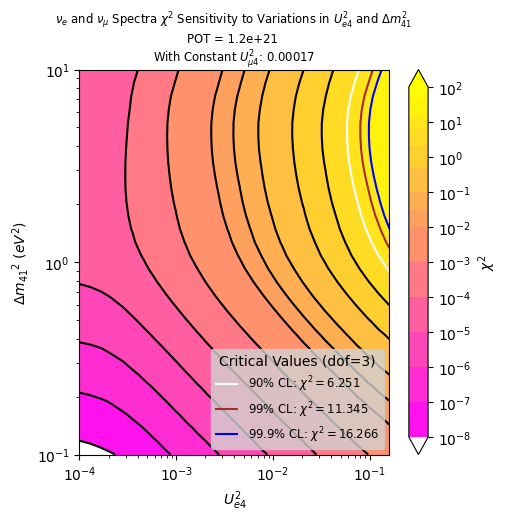

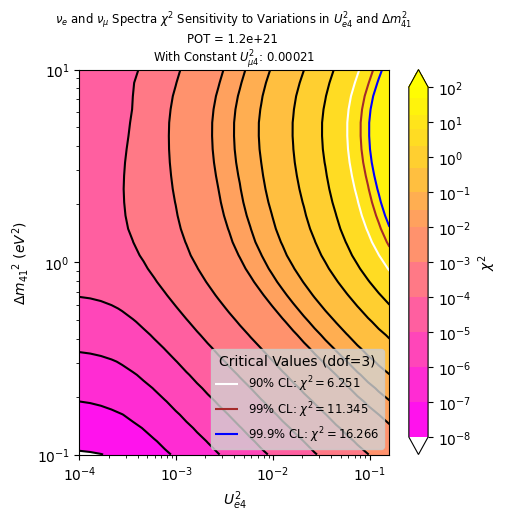

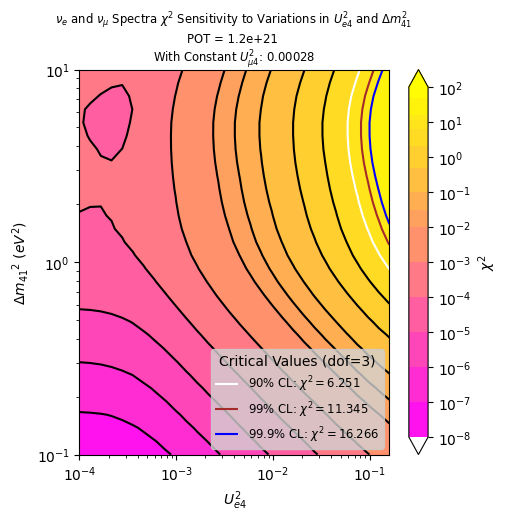

...

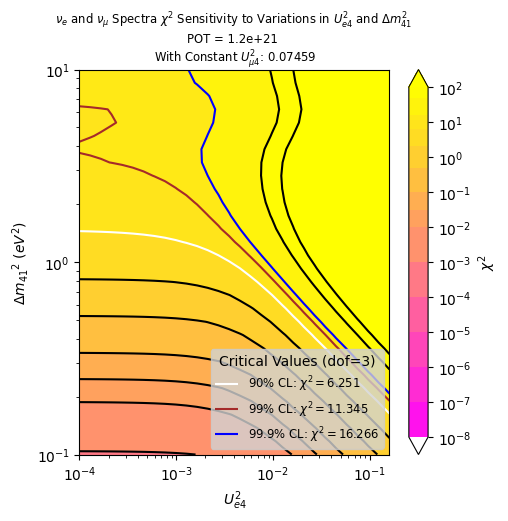

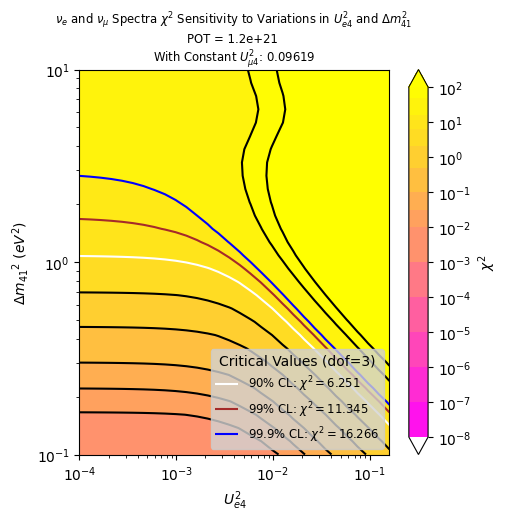

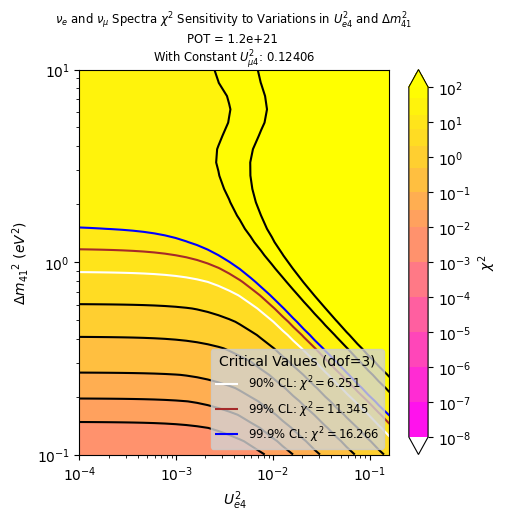

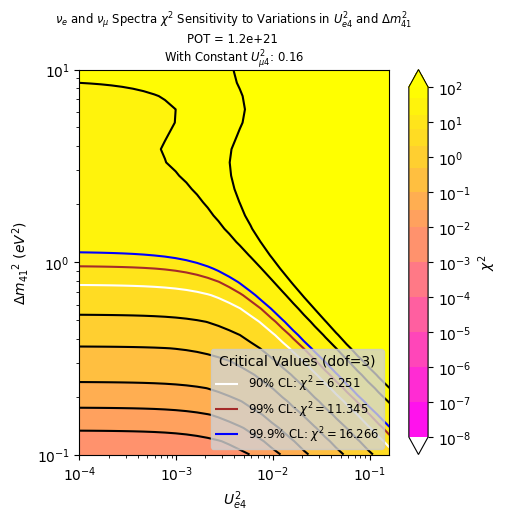

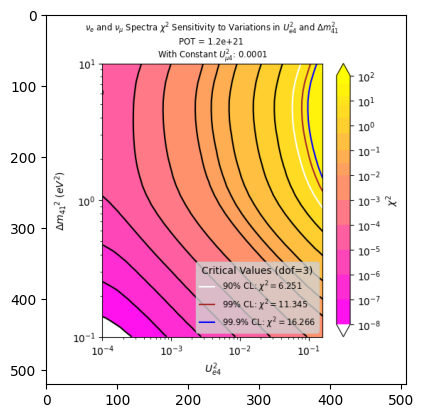

MovieWriter ffmpeg unavailable; using Pillow instead.


In [23]:
#make gif
for i in range(Um4s.shape[0]):
    plt.figure(figsize=(5,5))
    plt.contourf(Ue4s**2,deltam2s,chi2_3d_with_numu_reco[:,:,i],extend="both", norm="log",levels=[1e-8,1e-7,1e-6,1e-5,1e-4,1e-3,1e-2,0.03,0.1, 0.5,2,cl_90,cl_99,cl_999,50,100], cmap="spring")#, colors=["red","orange","yellow","green","blue","purple","pink"])
    plt.yscale("log")
    plt.xscale("log")
    cbar = plt.colorbar(label="$\chi^2$")
    cbar.set_ticks([1e-8,1e-7,1e-6,1e-5,1e-4,1e-3,0.01,0.1,1,10,100])

    CL = plt.contour(Ue4s**2,deltam2s, chi2_3d_with_numu_reco[:,:,i], norm="linear", levels=[0.01, 0.03, 0.1, 0.5,2], colors="black")
    #manual_locations = [(0.1,0.1),(0.41, 0.1), (0.37,0.2), (0.33, 0.3),(0.29, 0.4)]
    #plt.clabel(CL, inline=True, manual = manual_locations)
    CL1 = plt.contour(Ue4s**2,deltam2s, chi2_3d_with_numu_reco[:,:,i], norm="log", levels=[50,100], colors="black")
    #manual_locations1 = [(0.4,3)]
    #plt.clabel(CL1, inline=True, manual = manual_locations1)
    CL2 = plt.contour(Ue4s**2,deltam2s, chi2_3d_with_numu_reco[:,:,i], norm="log", levels=[cl_90, cl_99, cl_999], colors=["white","brown","blue"])
    critical_colors,critical_labels = CL2.legend_elements()
    #manual_locations2 = [(0.25,1),(0.25, 1.5),(0.25, 3)]
    #plt.clabel(CL2, inline=True, manual = manual_locations2)
    CL3 = plt.contour(Ue4s**2,deltam2s, chi2_3d_with_numu_reco[:,:,i], norm="linear", levels=[1e-8,1e-7,1e-6,1e-5,1e-4,1e-3], colors="black")
    #manual_locations3 = [(0.04, 0.15)]
    #plt.clabel(CL3, inline=True, manual = manual_locations3)
    
    plt.xlabel("$U_{e4}^2$")
    plt.ylabel("$\\Delta{m_{41}}^2$ $(eV^2)$")
    plt.title("$\\nu_{e}$ and $\\nu_{\mu}$ Spectra $\chi^2$ Sensitivity to Variations in $U_{e4}^2$ and $\\Delta{m^2_{41}}$ \nPOT = 1.2e+21 \nWith Constant $U_{\\mu4}^2$: " + str(round(Um4s[i]**2,5)), fontsize="small")
    plt.legend(critical_colors, ["90% CL: $\chi^2=$"+str(cl_90), "99% CL: $\chi^2=$"+str(cl_99), "99.9% CL: $\chi^2=$"+str(cl_999)], loc="lower right", facecolor="lightgray", title="Critical Values (dof="+str(dof)+")", fontsize="small")
    

    name = "Nue_and_Numu_chi2_reco/fig"+str(i)
    plt.savefig(name, format="png", bbox_inches="tight")
    plt.show()
    plt.close()
    
    
#combine the 2d contour plots into a single gif
k = []

for i in range(Um4s.shape[0]):
    name = "Nue_and_Numu_chi2_reco/fig" + str(i)
    k.append(mpim.imread(name))
    
    

# Create the figure and axes objects
fig, ax = plt.subplots()

# Set the initial image
im = ax.imshow(k[0], animated=True)

def update(i):
    im.set_array(k[i])
    return im, 

# Create the animation object
animation_fig = animation.FuncAnimation(fig, update, frames=len(k), interval=200, blit=True,repeat_delay=10,)

# Show the animation
plt.show()

animation_fig.save("Nue_and_Numu_chi2_sensitivity_reco.gif")

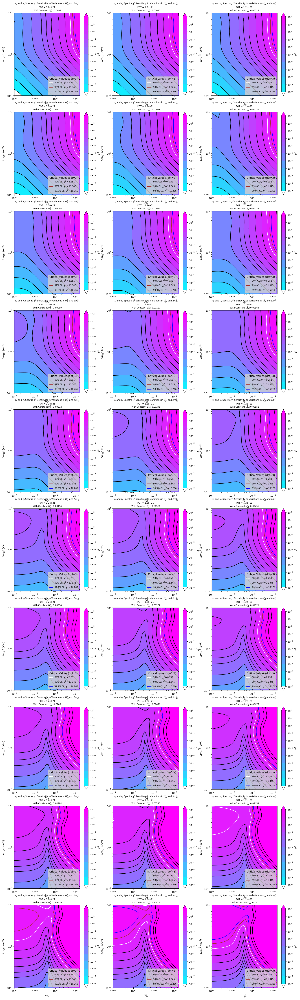

In [24]:
#make contour plots in U_m4 and deltm_41 plane
plt.figure(figsize=(20,70))
for i in range(Ue4s.shape[0]):
    
    plt.subplot(10,3,i+1)
    plt.contourf(Um4s**2,deltam2s,chi2_3d_with_numu_reco[:,i,:],extend="both", norm="log",levels=[1e-8,1e-7,1e-6, 0.00001,0.0001,0.001,0.01,0.03,0.1, 0.5,2,cl_90,cl_99,cl_999,50,100], cmap="cool")#, colors=["red","orange","yellow","green","blue","purple","pink"])
    plt.yscale("log")
    plt.xscale("log")
    cbar = plt.colorbar(label="$\chi^2$")
    cbar.set_ticks([1e-8,1e-7,1e-6, 0.00001, 0.0001, 0.001,0.01,0.1,1,10,100])

    CL = plt.contour(Um4s**2,deltam2s, chi2_3d_with_numu_reco[:,i,:], norm="linear", levels=[0.001,0.01, 0.03, 0.1, 0.5,2], colors="black")
    #manual_locations = [(0.1,0.1),(0.41, 0.1), (0.37,0.2), (0.33, 0.3),(0.29, 0.4)]
    #plt.clabel(CL, inline=True, manual = manual_locations)
    CL1 = plt.contour(Um4s**2,deltam2s, chi2_3d_with_numu_reco[:,i,:], norm="log", levels=[50,100], colors="black")
    #manual_locations1 = [(0.4,3)]
    #plt.clabel(CL1, inline=True, manual = manual_locations1)
    CL2 = plt.contour(Um4s**2,deltam2s, chi2_3d_with_numu_reco[:,i,:], norm="log", levels=[cl_90,cl_99,cl_999], colors=["white","brown","blue"])
    critical_colors,critical_labels = CL2.legend_elements()
    #manual_locations2 = [(0.25,1),(0.25, 1.5),(0.25, 3)]
    #plt.clabel(CL2, inline=True, manual = manual_locations2)
    CL3 = plt.contour(Um4s**2,deltam2s, chi2_3d_with_numu_reco[:,i,:], norm="linear", levels=[0.0001], colors="black")
    #manual_locations3 = [(0.04, 0.15)]
    #plt.clabel(CL3, inline=True, manual = manual_locations3)
    CL3 = plt.contour(Um4s**2,deltam2s, chi2_3d_with_numu_reco[:,i,:], norm="linear", levels=[1e-8,1e-7,1e-6, 0.00001], colors="black")
    #manual_locations3 = []
    #plt.clabel(CL3, inline=True, manual = manual_locations3)
    
    plt.xlabel("$U_{\\mu4}^2$")
    plt.ylabel("$\\Delta{m_{41}}^2$ $(eV^2)$")
    plt.title("$\\nu_{e}$ and $\\nu_{\mu}$ Spectra $\chi^2$ Sensitivity to Variations in $U_{\\mu4}^2$ and $\\Delta{m^2_{41}}$ \nPOT = 1.2e+21 \nWith Constant $U_{e4}^2$: " + str(round(Ue4s[i]**2,5)), fontsize="small")
    plt.legend(critical_colors, ["90% CL: $\chi^2=$"+str(cl_90), "99% CL: $\chi^2=$"+str(cl_99), "99.9% CL: $\chi^2=$"+str(cl_999)], loc="lower right", facecolor="lightgray", title="Critical Values (dof="+str(dof)+")", fontsize="small")

       

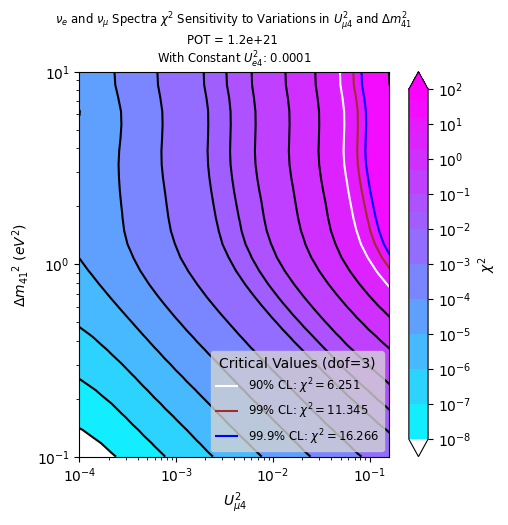

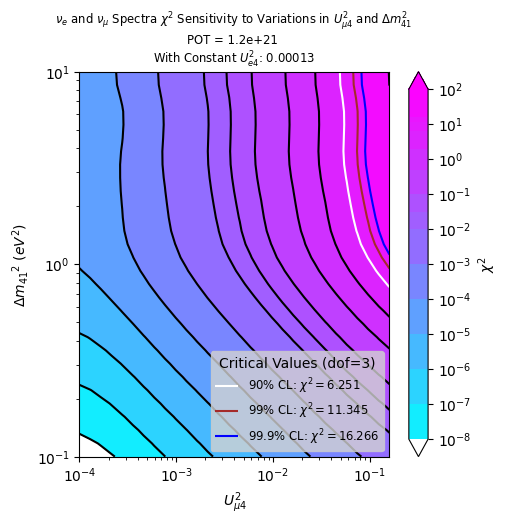

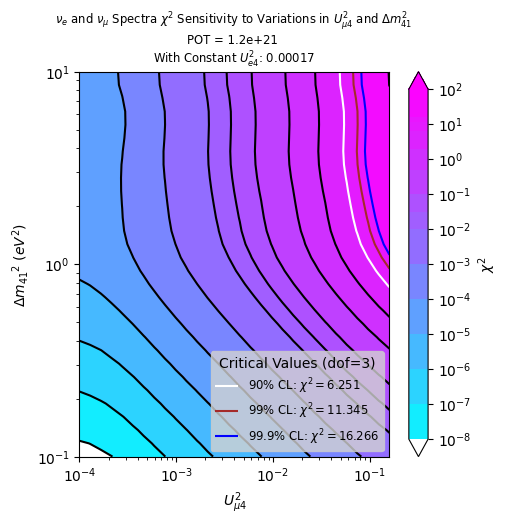

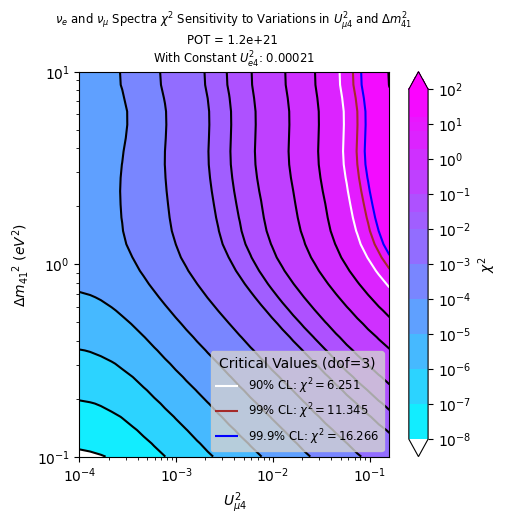

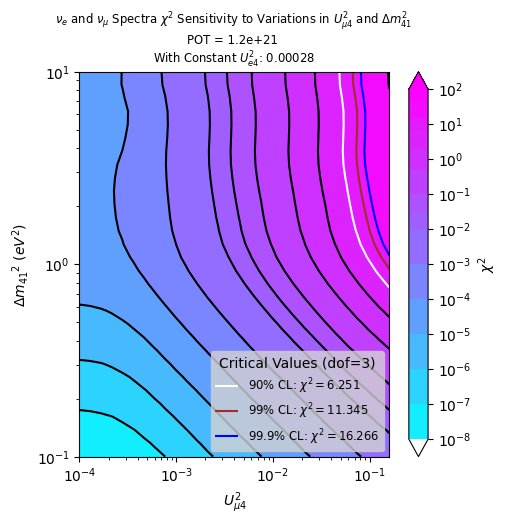

...

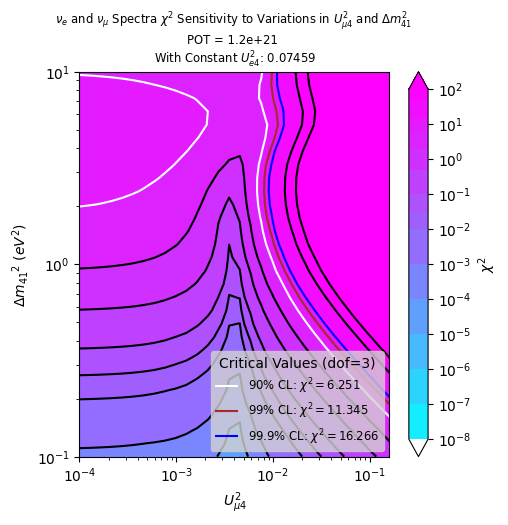

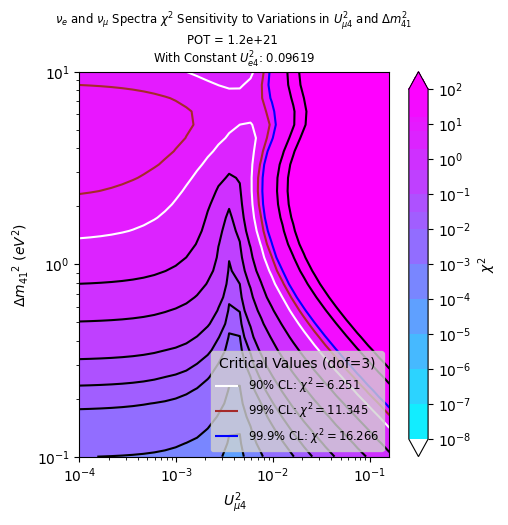

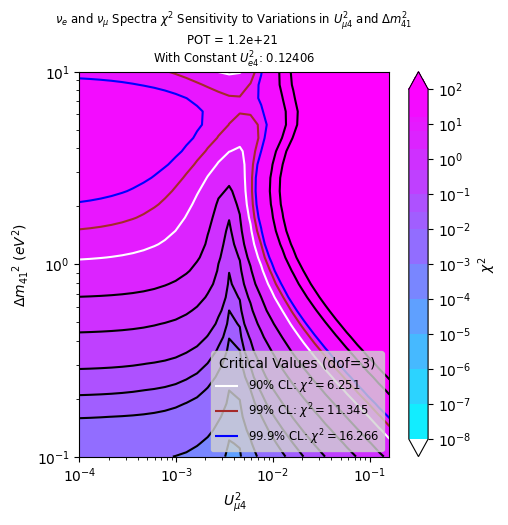

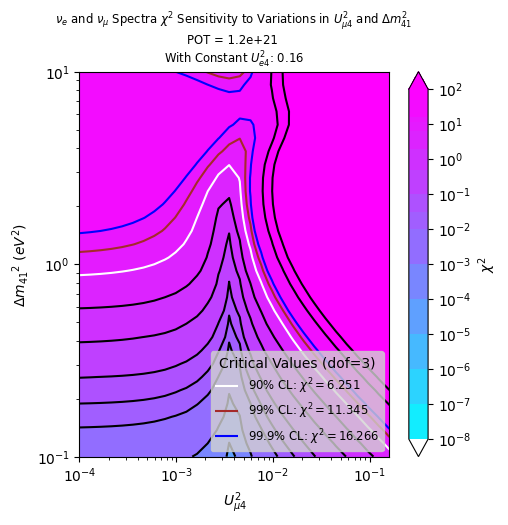

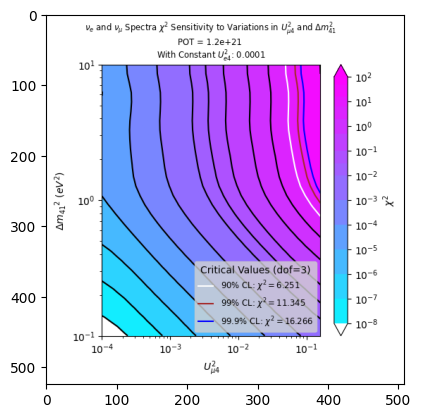

MovieWriter ffmpeg unavailable; using Pillow instead.


In [25]:
#make gif
for i in range(Ue4s.shape[0]):
    plt.figure(figsize=(5,5))
    plt.contourf(Um4s**2,deltam2s,chi2_3d_with_numu_reco[:,i,:],extend="both", norm="log",levels=[1e-8,1e-7,1e-6, 0.00001,0.0001,0.001,0.01,0.03,0.1, 0.5,2,cl_90,cl_99,cl_999,50,100], cmap="cool")#, colors=["red","orange","yellow","green","blue","purple","pink"])
    plt.yscale("log")
    plt.xscale("log")
    cbar = plt.colorbar(label="$\chi^2$")
    cbar.set_ticks([1e-8,1e-7,1e-6, 0.00001, 0.0001, 0.001,0.01,0.1,1,10,100])

    CL = plt.contour(Um4s**2,deltam2s, chi2_3d_with_numu_reco[:,i,:], norm="linear", levels=[0.001,0.01, 0.03, 0.1, 0.5,2], colors="black")
    #manual_locations = [(0.1,0.1),(0.41, 0.1), (0.37,0.2), (0.33, 0.3),(0.29, 0.4)]
    #plt.clabel(CL, inline=True, manual = manual_locations)
    CL1 = plt.contour(Um4s**2,deltam2s, chi2_3d_with_numu_reco[:,i,:], norm="log", levels=[50,100], colors="black")
    #manual_locations1 = [(0.4,3)]
    #plt.clabel(CL1, inline=True, manual = manual_locations1)
    CL2 = plt.contour(Um4s**2,deltam2s, chi2_3d_with_numu_reco[:,i,:], norm="log", levels=[cl_90,cl_99,cl_999], colors=["white","brown","blue"])
    critical_colors,critical_labels = CL2.legend_elements()
    #manual_locations2 = [(0.25,1),(0.25, 1.5),(0.25, 3)]
    #plt.clabel(CL2, inline=True, manual = manual_locations2)
    CL3 = plt.contour(Um4s**2,deltam2s, chi2_3d_with_numu_reco[:,i,:], norm="linear", levels=[0.0001], colors="black")
    #manual_locations3 = [(0.04, 0.15)]
    #plt.clabel(CL3, inline=True, manual = manual_locations3)
    CL3 = plt.contour(Um4s**2,deltam2s, chi2_3d_with_numu_reco[:,i,:], norm="linear", levels=[1e-8,1e-7,1e-6, 0.00001], colors="black")
    #manual_locations3 = []
    #plt.clabel(CL3, inline=True, manual = manual_locations3)
    
    plt.xlabel("$U_{\\mu4}^2$")
    plt.ylabel("$\\Delta{m_{41}}^2$ $(eV^2)$")
    plt.title("$\\nu_{e}$ and $\\nu_{\mu}$ Spectra $\chi^2$ Sensitivity to Variations in $U_{\\mu4}^2$ and $\\Delta{m^2_{41}}$ \nPOT = 1.2e+21 \nWith Constant $U_{e4}^2$: " + str(round(Ue4s[i]**2,5)), fontsize="small")
    plt.legend(critical_colors, ["90% CL: $\chi^2=$"+str(cl_90), "99% CL: $\chi^2=$"+str(cl_99), "99.9% CL: $\chi^2=$"+str(cl_999)], loc="lower right", facecolor="lightgray", title="Critical Values (dof="+str(dof)+")", fontsize="small")

    name = "Nue_and_Numu_chi2_2_reco/fig"+str(i)
    plt.savefig(name, format="png", bbox_inches="tight")
    plt.show()
    plt.close()
    
#combine the 2d contour plots into a single gif
k = []

for i in range(Ue4s.shape[0]):
    name = "Nue_and_Numu_chi2_2_reco/fig" + str(i)
    k.append(mpim.imread(name))
    

# Create the figure and axes objects
fig, ax = plt.subplots()

# Set the initial image
im = ax.imshow(k[0], animated=True)

def update(i):
    im.set_array(k[i])
    return im, 

# Create the animation object
animation_fig = animation.FuncAnimation(fig, update, frames=len(k), interval=200, blit=True,repeat_delay=10,)

# Show the animation
plt.show()

animation_fig.save("Nue_and_Numu_v2_chi2_sensitivity_reco.gif")
    